In [ ]:
# Load the dataset from the specified location.
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv("C:/Users/user/Downloads/healthcare_dataset.csv")
# Display the first 5 rows of the dataset.
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal


In [ ]:
# Check the shape (rows, columns) of the dataset.
df.shape

(55500, 15)

In [ ]:
df.duplicated().sum()# Count the number of duplicated rows in the dataset.

534

In [ ]:
df = df.drop_duplicates()  #Drop duplicate rows.

In [27]:
df.duplicated().sum()

0

In [33]:
df.isnull().sum().sum()

0

In [35]:
df.isnull().sum()

Name                  0
Age                   0
Gender                0
Blood Type            0
Medical Condition     0
Date of Admission     0
Doctor                0
Hospital              0
Insurance Provider    0
Billing Amount        0
Room Number           0
Admission Type        0
Discharge Date        0
Medication            0
Test Results          0
dtype: int64

In [37]:
df.describe()

,Age,Billing Amount,Room Number
count,54966.000000,54966.000000,54966.000000
mean,51.535185,25544.306284,301.124404
std,19.605661,14208.409711,115.223143
min,13.000000,-2008.492140,101.000000
25%,35.000000,13243.718641,202.000000
50%,52.000000,25542.749145,302.000000
75%,68.000000,37819.858159,401.000000
max,89.000000,52764.276736,500.000000


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Name                54966 non-null  object 
 1   Age                 54966 non-null  int64  
 2   Gender              54966 non-null  object 
 3   Blood Type          54966 non-null  object 
 4   Medical Condition   54966 non-null  object 
 5   Date of Admission   54966 non-null  object 
 6   Doctor              54966 non-null  object 
 7   Hospital            54966 non-null  object 
 8   Insurance Provider  54966 non-null  object 
 9   Billing Amount      54966 non-null  float64
 10  Room Number         54966 non-null  int64  
 11  Admission Type      54966 non-null  object 
 12  Discharge Date      54966 non-null  object 
 13  Medication          54966 non-null  object 
 14  Test Results        54966 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 6.7+ MB


In [41]:
df.nunique()

Name                  49992
Age                      77
Gender                    2
Blood Type                8
Medical Condition         6
Date of Admission      1827
Doctor                40341
Hospital              39876
Insurance Provider        5
Billing Amount        50000
Room Number             400
Admission Type            3
Discharge Date         1856
Medication                5
Test Results              3
dtype: int64

In [43]:
object_columns = df.select_dtypes(include = ['object']).columns
print("Object Type Columns : ")
print(object_columns)

numerical_columns = df.select_dtypes(include =['int64','float64']).columns
print("numerical Type Columns : ")
print(numerical_columns)

Object Type Columns : 
Index(['Name', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Admission Type', 'Discharge Date', 'Medication', 'Test Results'],
      dtype='object')
numerical Type Columns : 
Index(['Age', 'Billing Amount', 'Room Number'], dtype='object')


In [80]:
import pandas as pd

# Define the function
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype == 'object':
            if df[column].nunique() < 10:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)
                
    return categorical_features, non_categorical_features, discrete_features, continuous_features



# Call the function and print results
categorical_features, non_categorical_features, discrete_features, continuous_features = classify_features(df)

print("Categorical_features :", categorical_features)
print("***************")
print("Non_categorical_features :", non_categorical_features)
print("***************")
print("Discrete_features :", discrete_features)
print("***************")
print("Continuous_features :", continuous_features)
print("***************")


Categorical_features : ['Gender', 'Blood Type', 'Medical Condition', 'Insurance Provider', 'Admission Type', 'Medication', 'Test Results']
***************
Non_categorical_features : ['Name', 'Date of Admission', 'Doctor', 'Hospital', 'Discharge Date']
***************
Discrete_features : []
***************
Continuous_features : ['Age', 'Billing Amount', 'Room Number']
***************


In [82]:
for i in categorical:
    print(i)
    print(df[i].unique())
    print()

Gender
['Male' 'Female']

Blood Type
['B-' 'A+' 'A-' 'O+' 'AB+' 'AB-' 'B+' 'O-']

Medical Condition
['Cancer' 'Obesity' 'Diabetes' 'Asthma' 'Hypertension' 'Arthritis']

Insurance Provider
['Blue Cross' 'Medicare' 'Aetna' 'UnitedHealthcare' 'Cigna']

Admission Type
['Urgent' 'Emergency' 'Elective']

Medication
['Paracetamol' 'Ibuprofen' 'Aspirin' 'Penicillin' 'Lipitor']

Test Results
['Normal' 'Inconclusive' 'Abnormal']



In [84]:
for i in categorical:
    print(i)
    print(df[i].value_counts())
    print()

Gender
Gender
Male      27496
Female    27470
Name: count, dtype: int64

Blood Type
Blood Type
A-     6898
A+     6896
B+     6885
AB+    6882
AB-    6874
B-     6872
O+     6855
O-     6804
Name: count, dtype: int64

Medical Condition
Medical Condition
Arthritis       9218
Diabetes        9216
Hypertension    9151
Obesity         9146
Cancer          9140
Asthma          9095
Name: count, dtype: int64

Insurance Provider
Insurance Provider
Cigna               11139
Medicare            11039
UnitedHealthcare    11014
Blue Cross          10952
Aetna               10822
Name: count, dtype: int64

Admission Type
Admission Type
Elective     18473
Urgent       18391
Emergency    18102
Name: count, dtype: int64

Medication
Medication
Lipitor        11038
Ibuprofen      11023
Aspirin        10984
Paracetamol    10965
Penicillin     10956
Name: count, dtype: int64

Test Results
Test Results
Abnormal        18437
Normal          18331
Inconclusive    18198
Name: count, dtype: int64



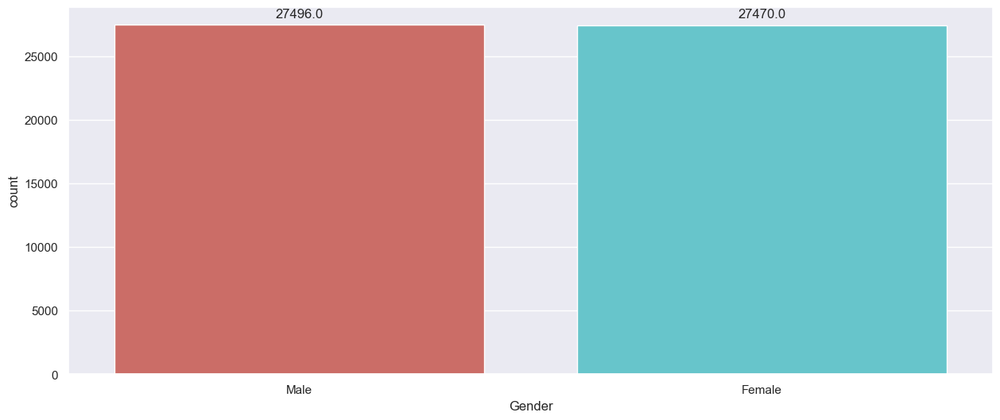

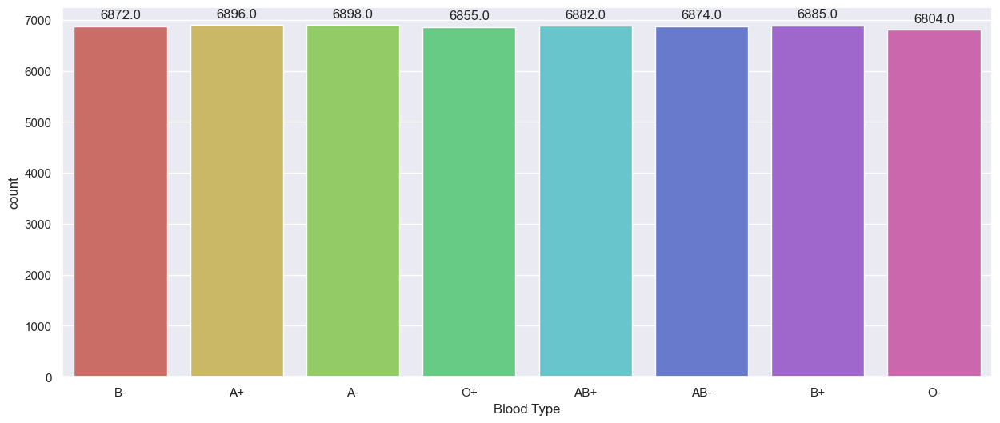

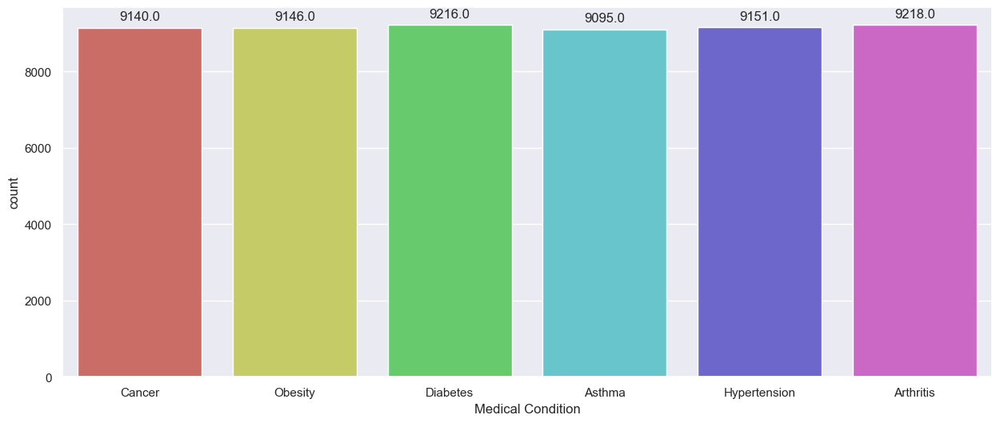

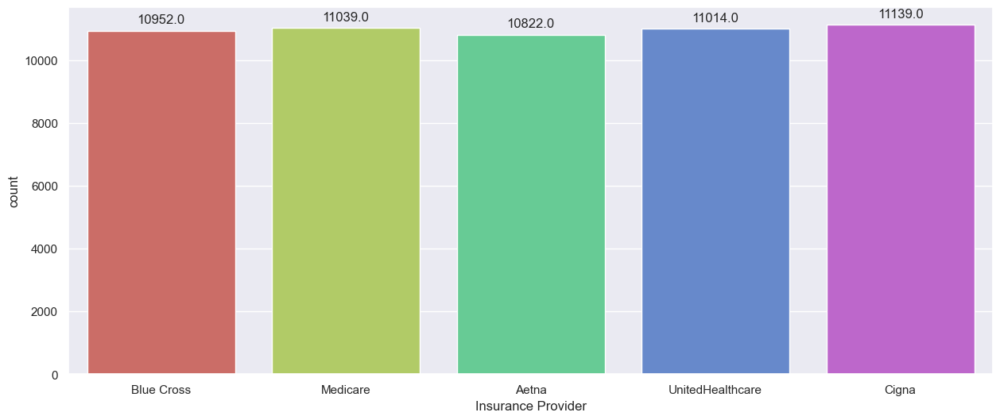

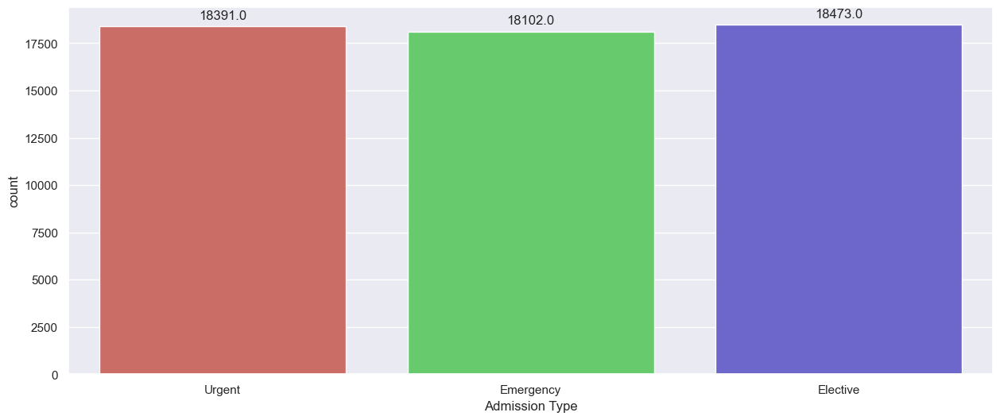

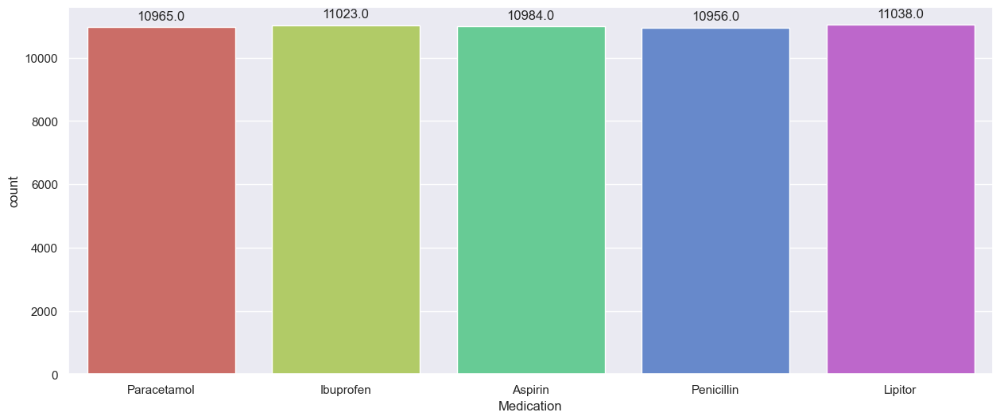

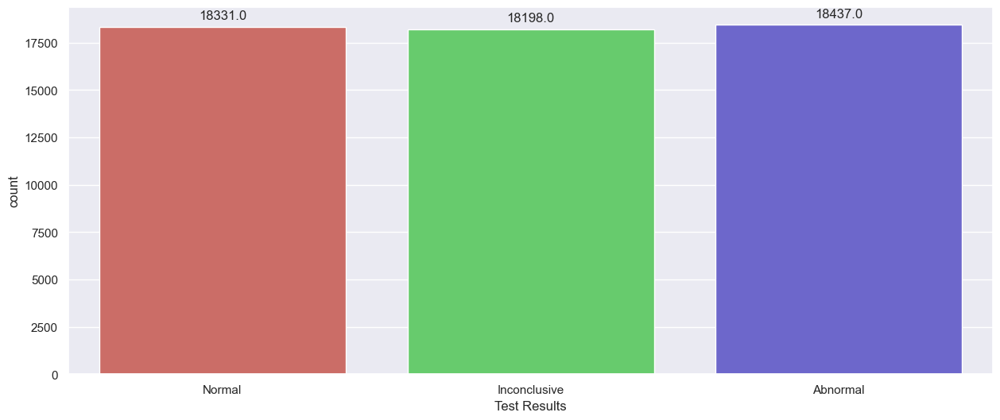

In [91]:
for i in categorical:
    plt.figure(figsize=(15,6))
    ax = sns.countplot(x=i, data=df, palette='hls')
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f"{height}",
                    xy=(p.get_x() + p.get_width() / 2.,height),
                    xytext = (0,10),
        textcoords="offset points",
        ha="center", va="center")
    plt.show()

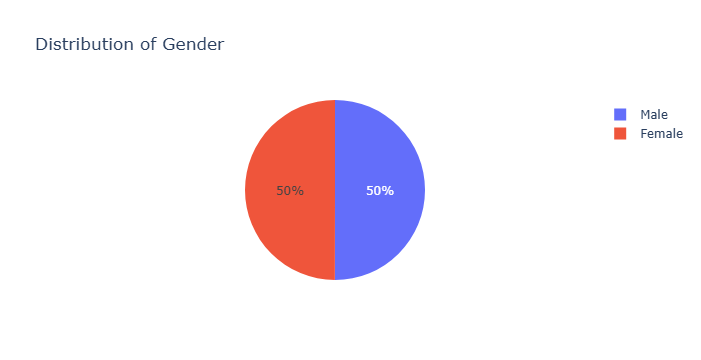

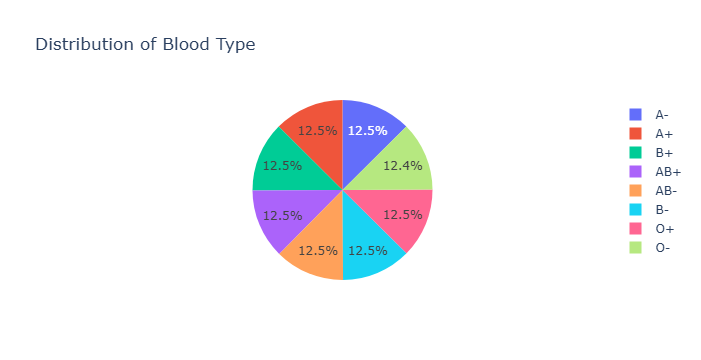

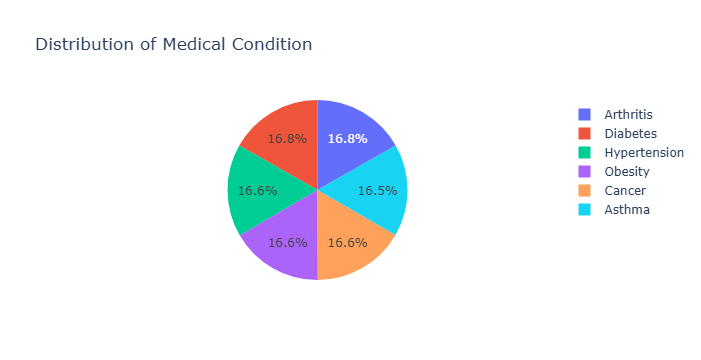

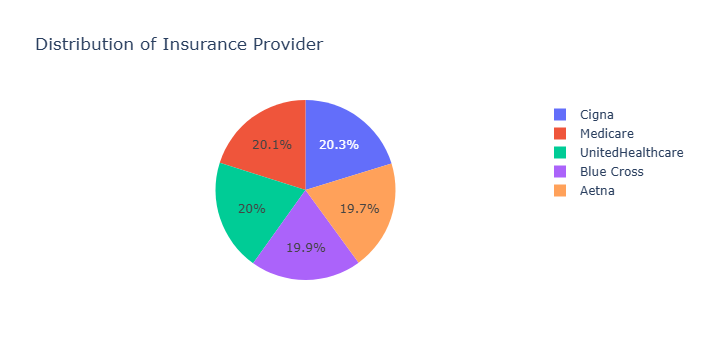

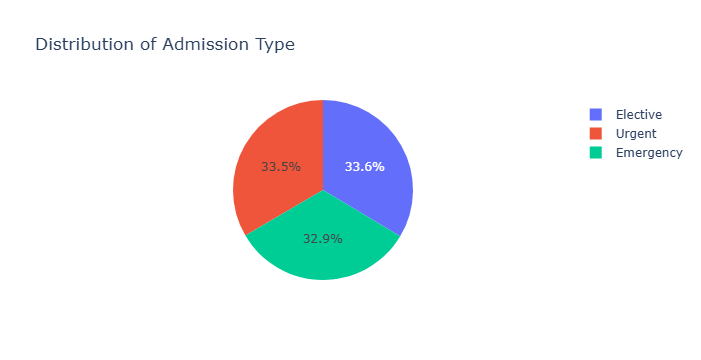

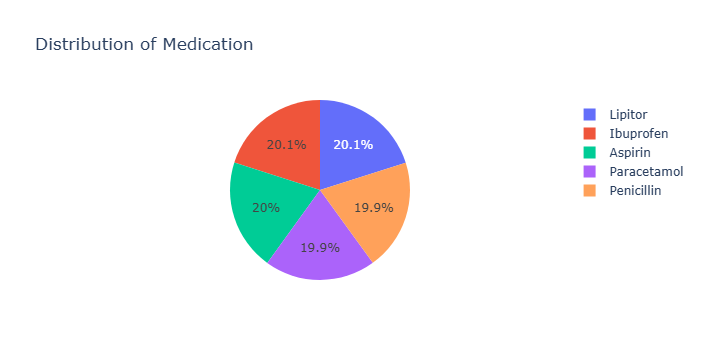

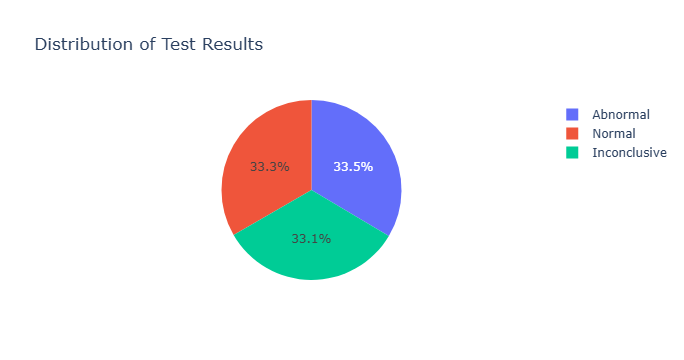

In [93]:
import plotly.express as px

for i in categorical:
    counts = df[i].value_counts()
    fig  = px.pie(counts, values=counts.values, names=counts.index, title=f"Distribution of {i}")
    fig.show()

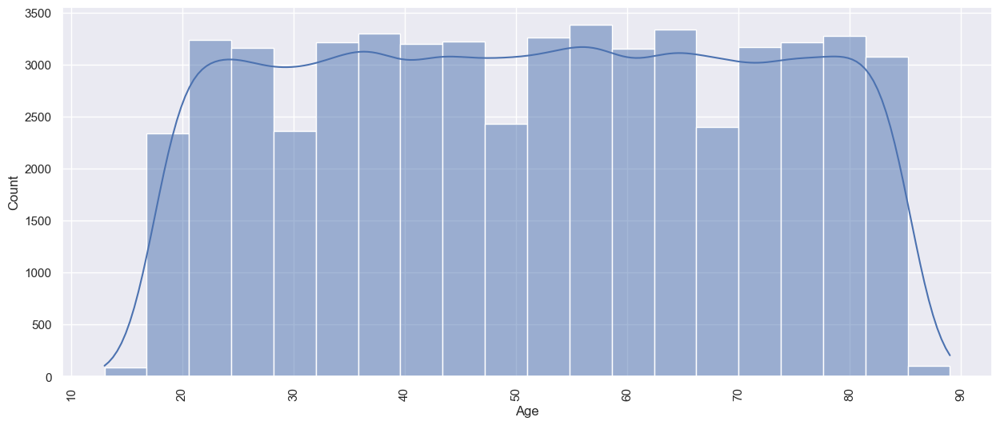

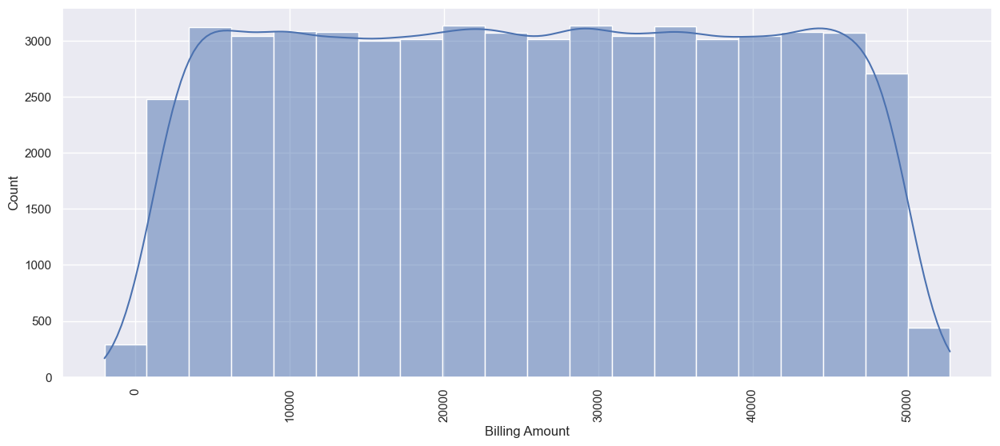

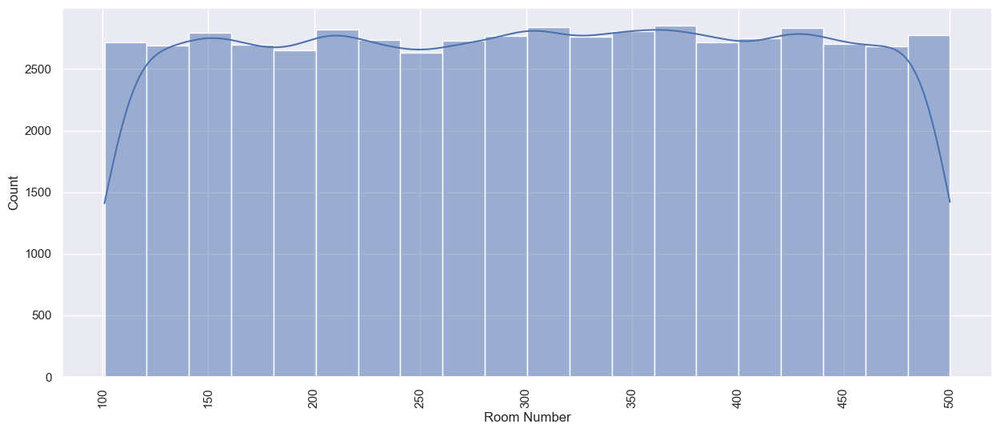

In [95]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], bins=20, kde=True, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

<Figure size 1500x600 with 0 Axes>

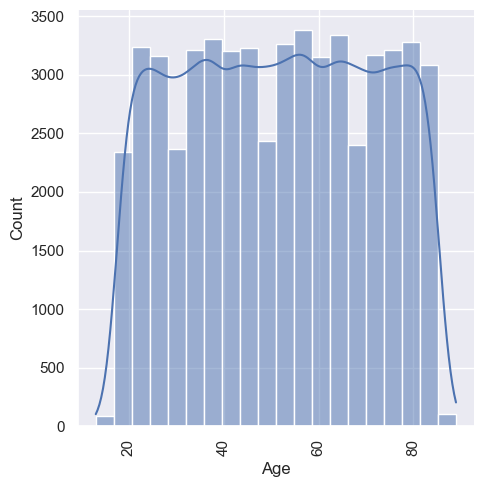

<Figure size 1500x600 with 0 Axes>

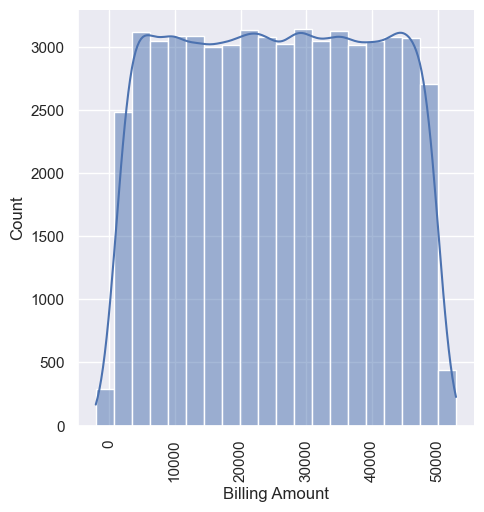

<Figure size 1500x600 with 0 Axes>

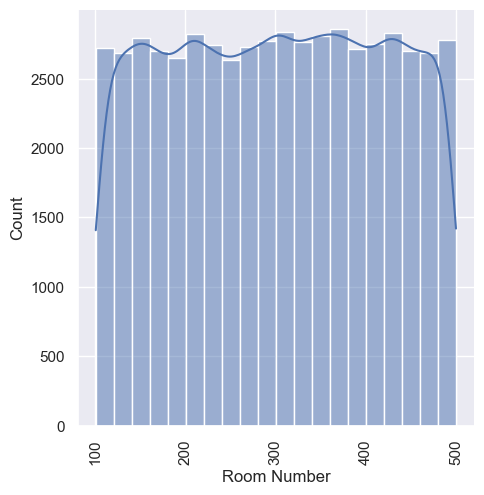

In [97]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.displot(df[i], bins=20, kde=True)
    plt.xticks(rotation=90)
    plt.show()

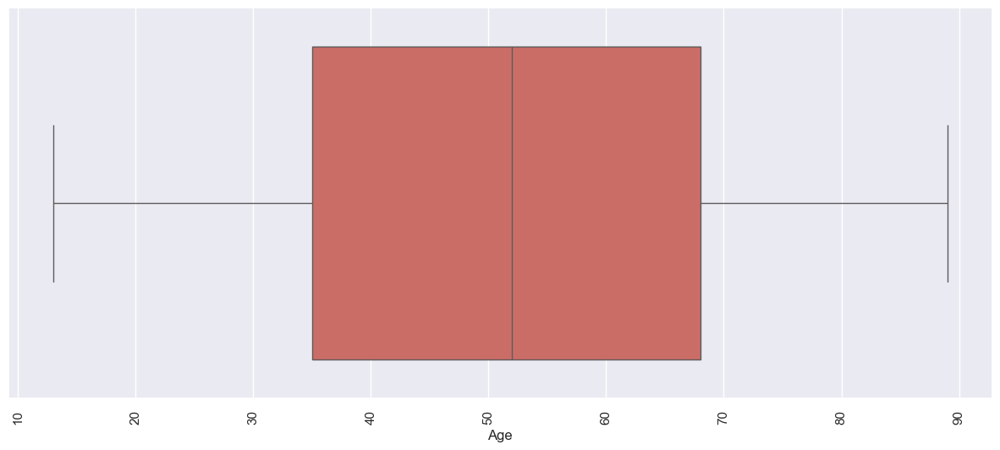

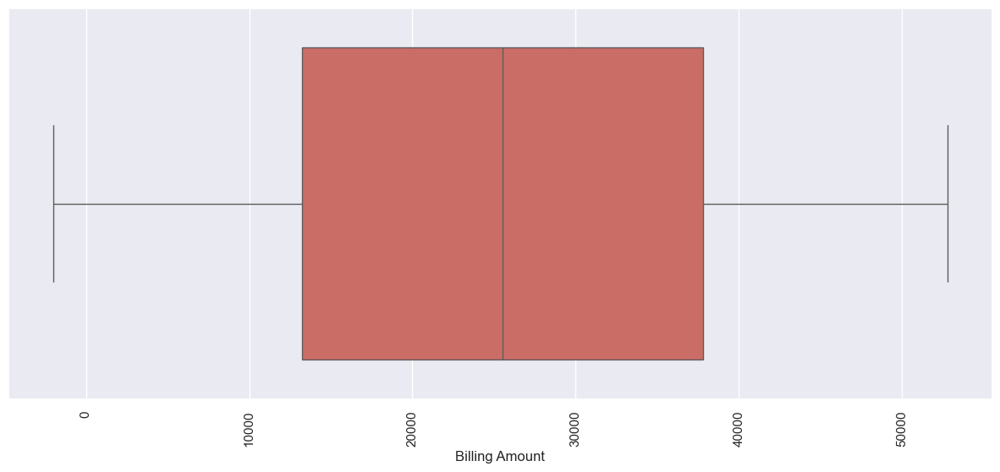

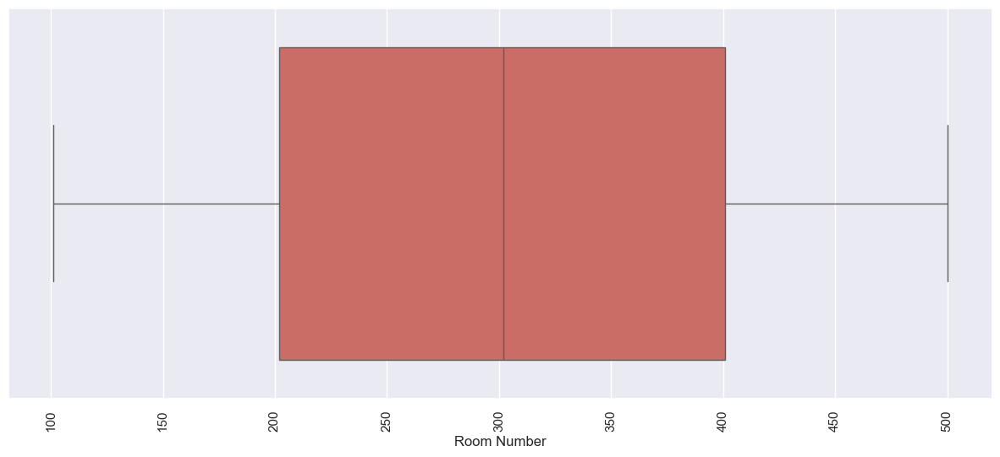

In [99]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.boxplot(x = i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

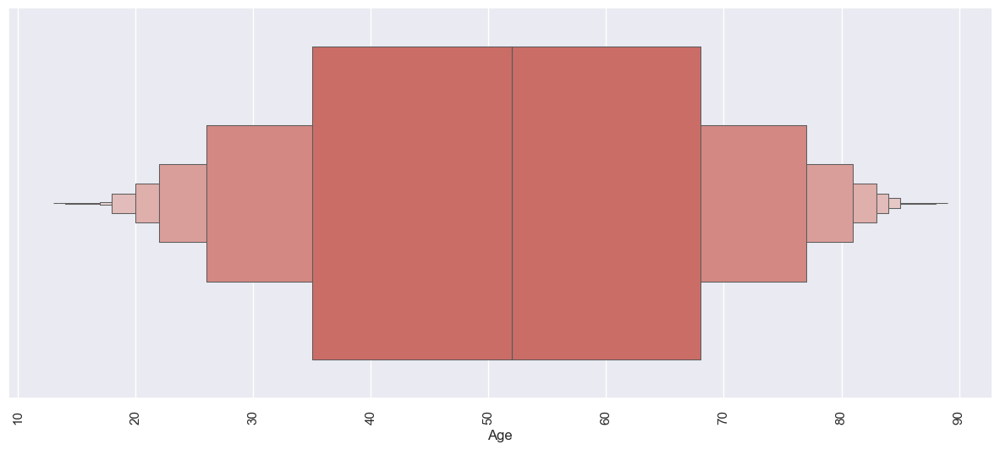

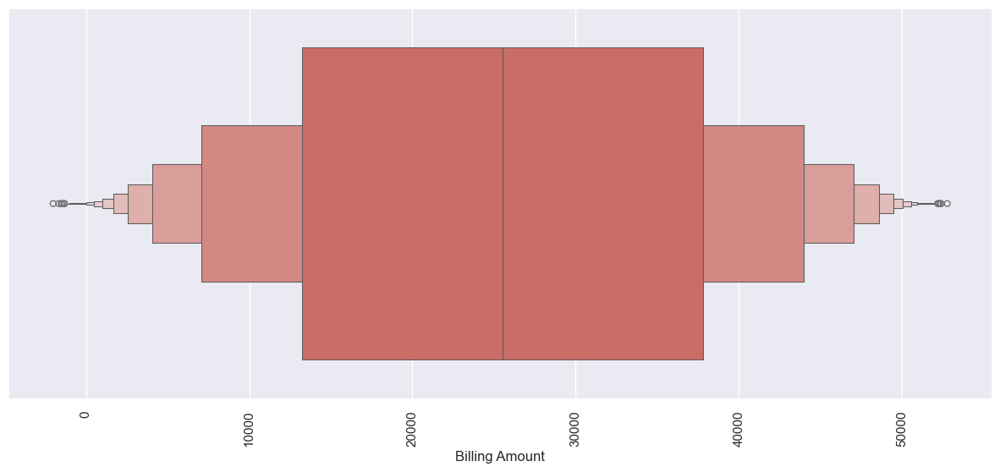

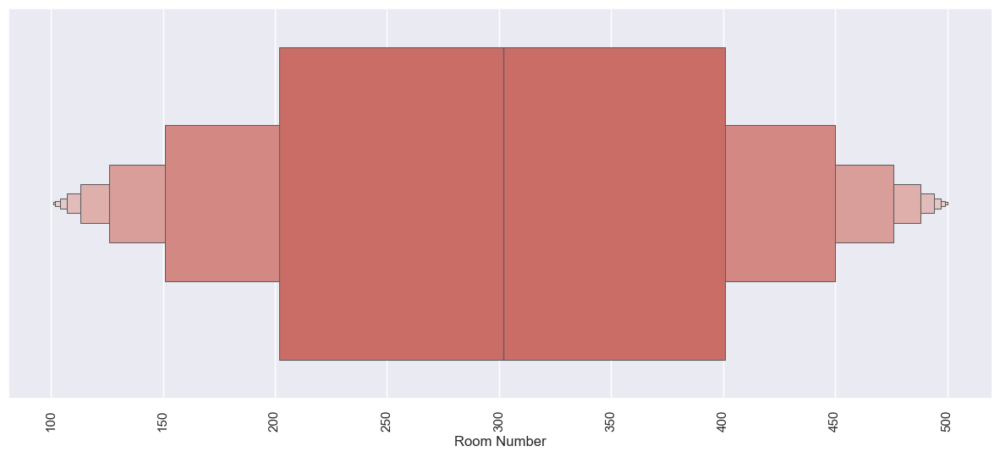

In [101]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.boxenplot(x = i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

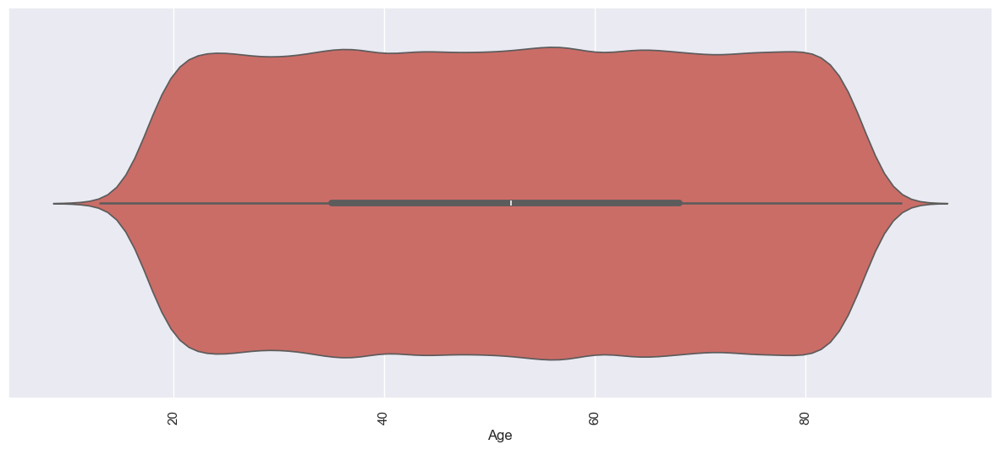

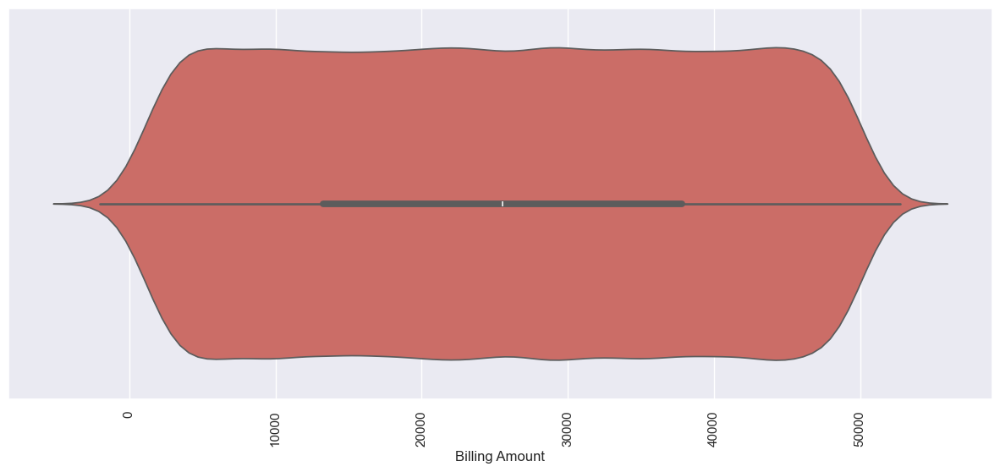

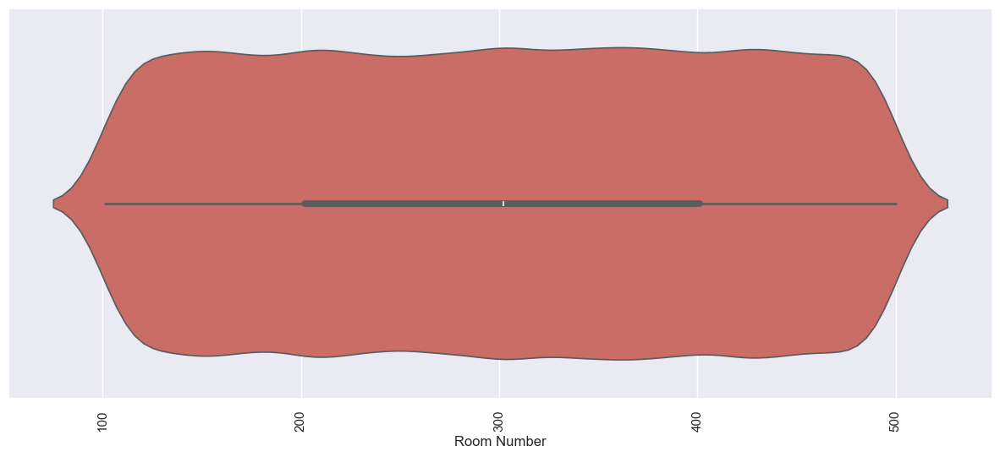

In [103]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.violinplot(x = i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

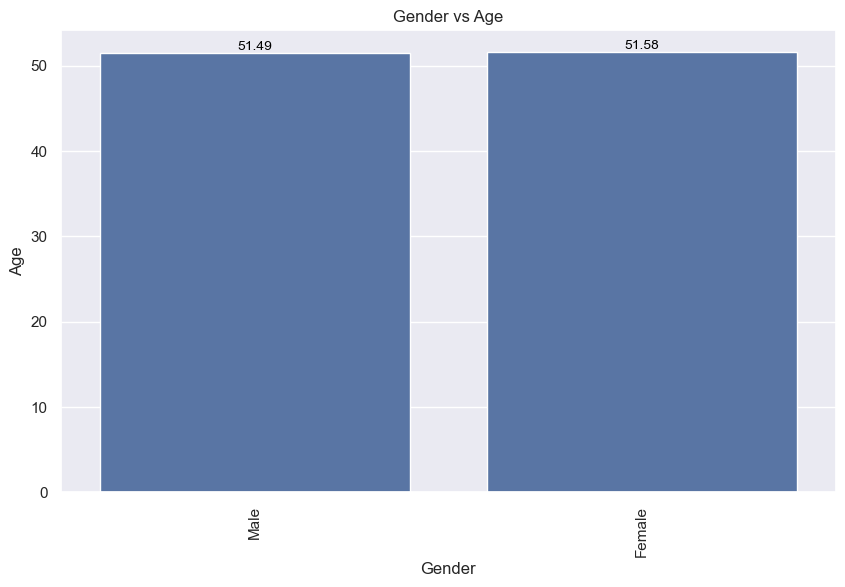

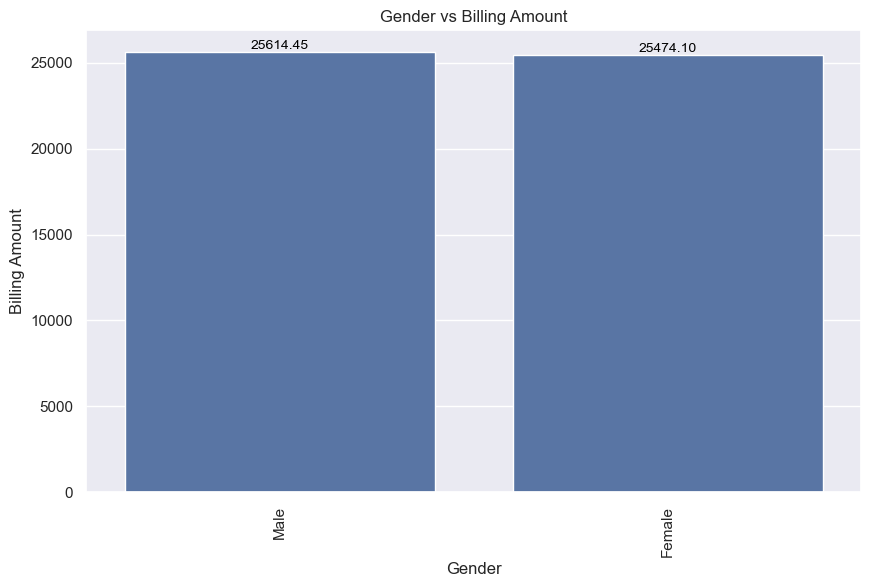

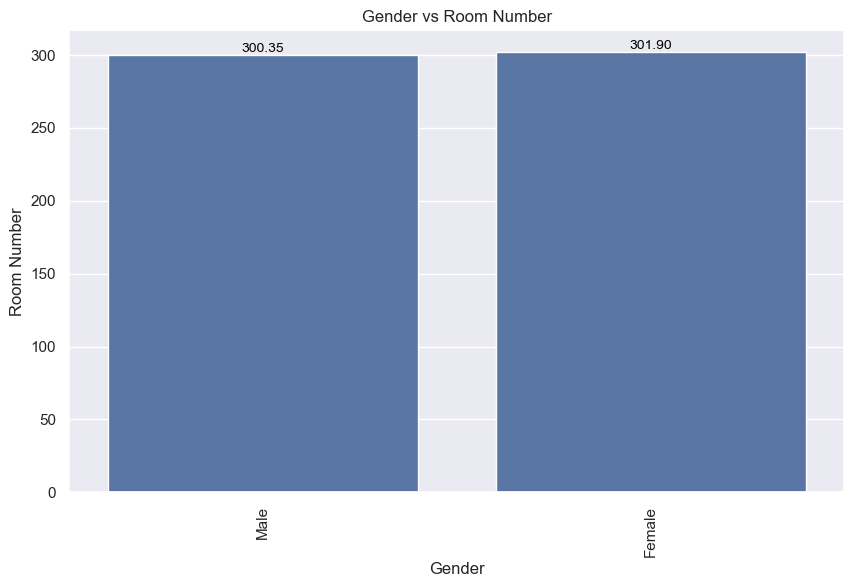

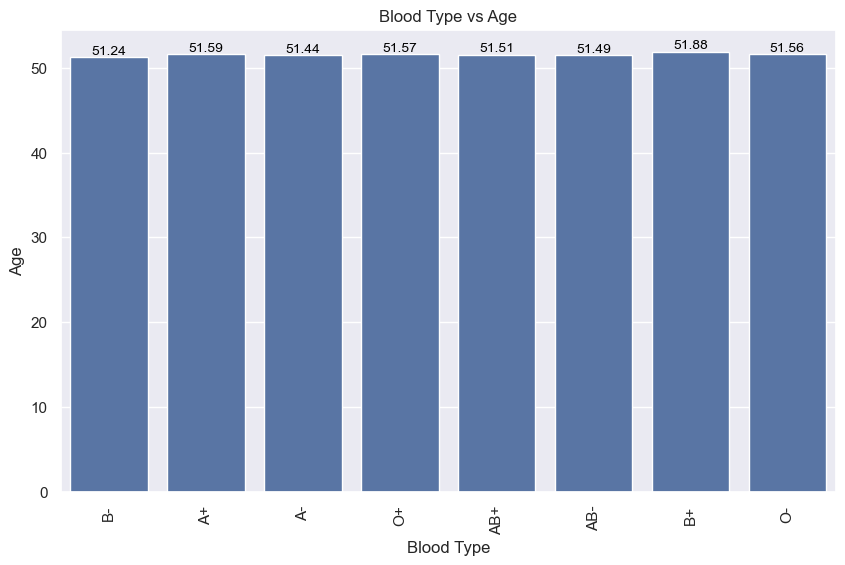

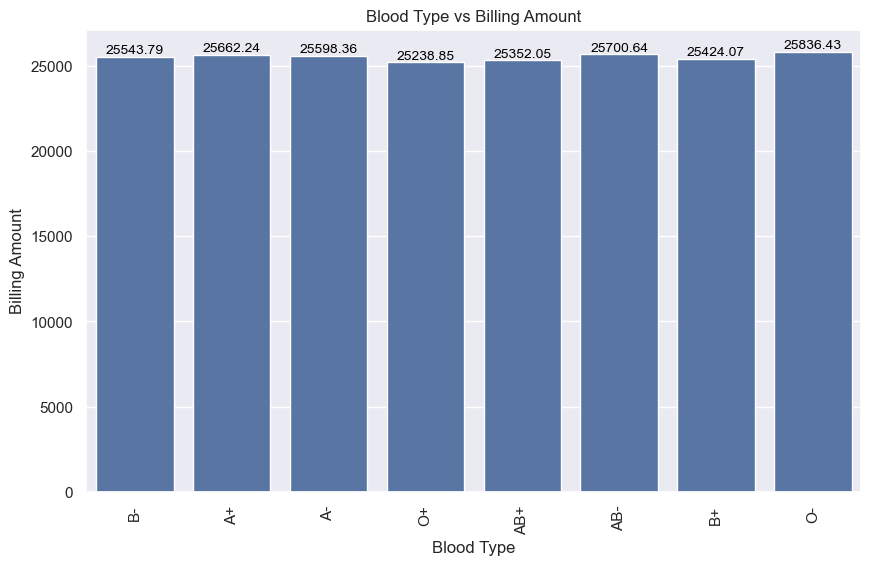

...

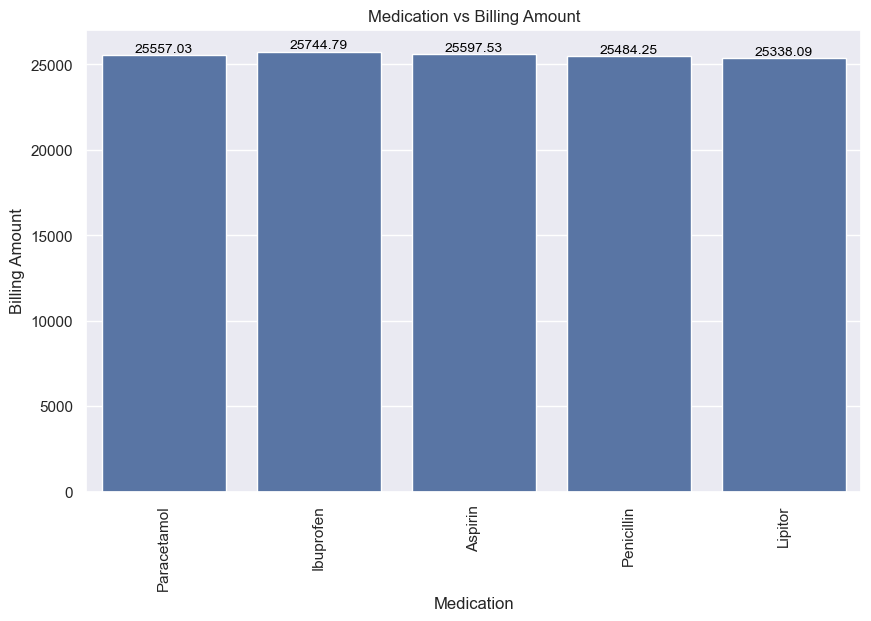

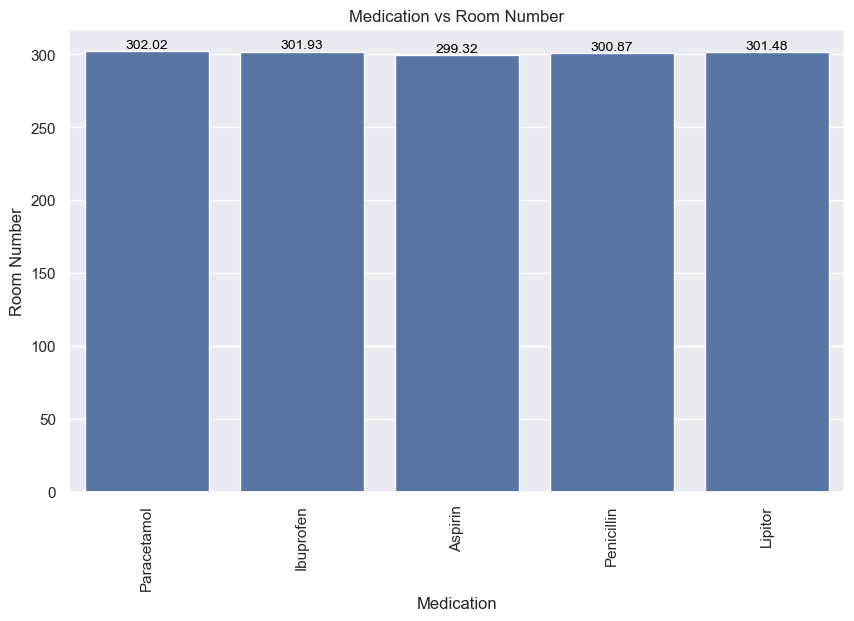

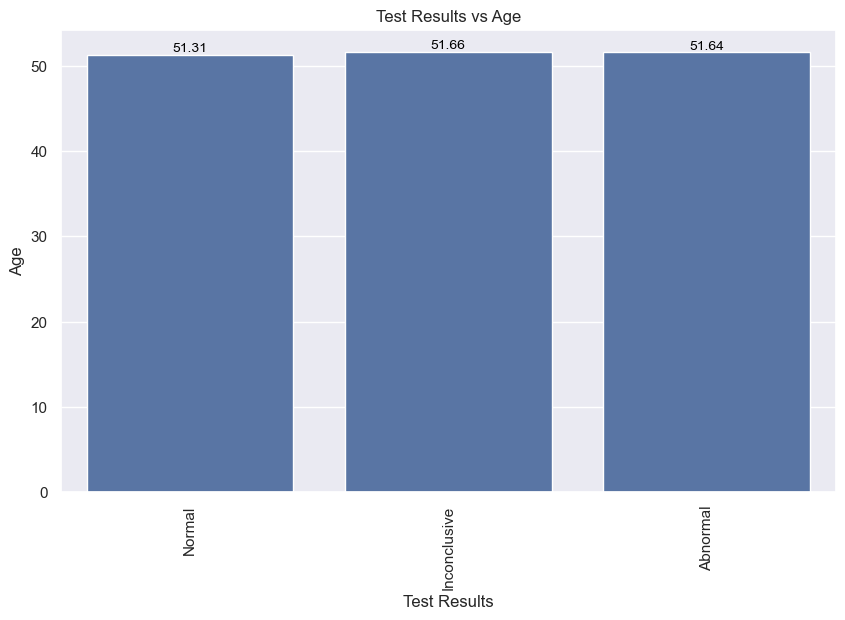

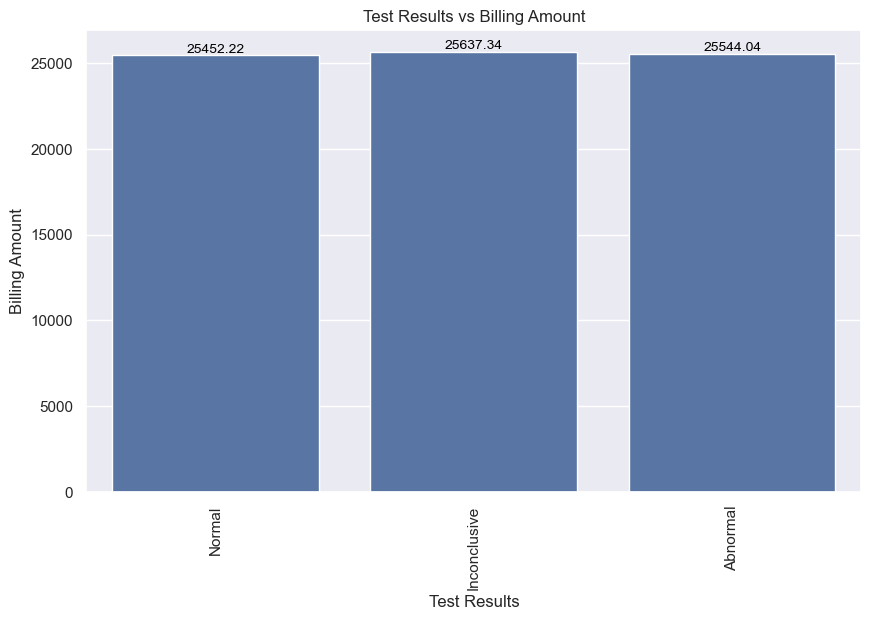

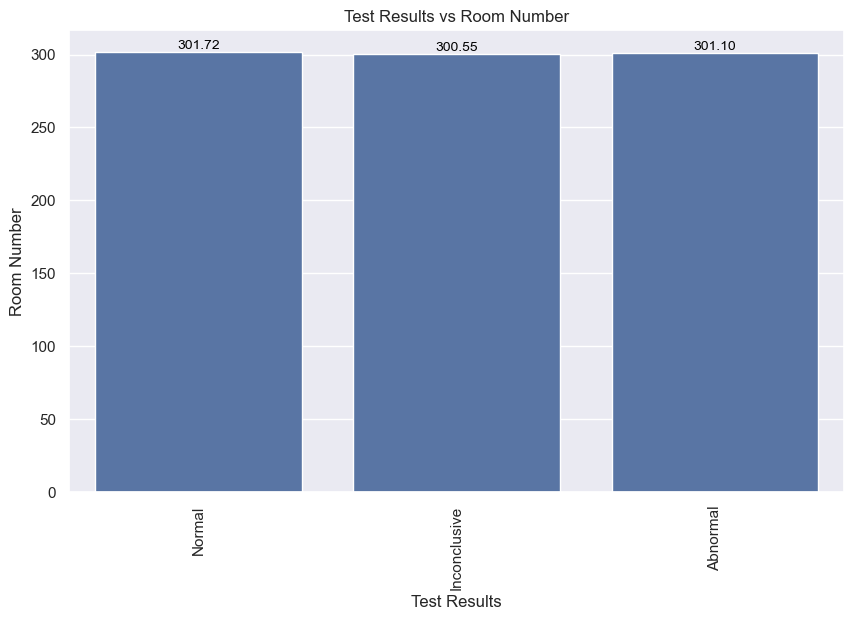

In [113]:
for dis in categorical:  
    for cont in continuous: 
        plt.figure(figsize=(10, 6))  
        ax = sns.barplot(data=df, x=dis, y=cont, ci=None)
        plt.title(f'{dis} vs {cont}')  

        for p in ax.patches:
            height = p.get_height()
            ax.annotate(
                f"{height:.2f}",  
                (p.get_x() + p.get_width() / 2., height), 
                ha="center", va="bottom", 
                fontsize=10, color="black", rotation=0 
            )
        plt.xticks(rotation=90)
        plt.show()


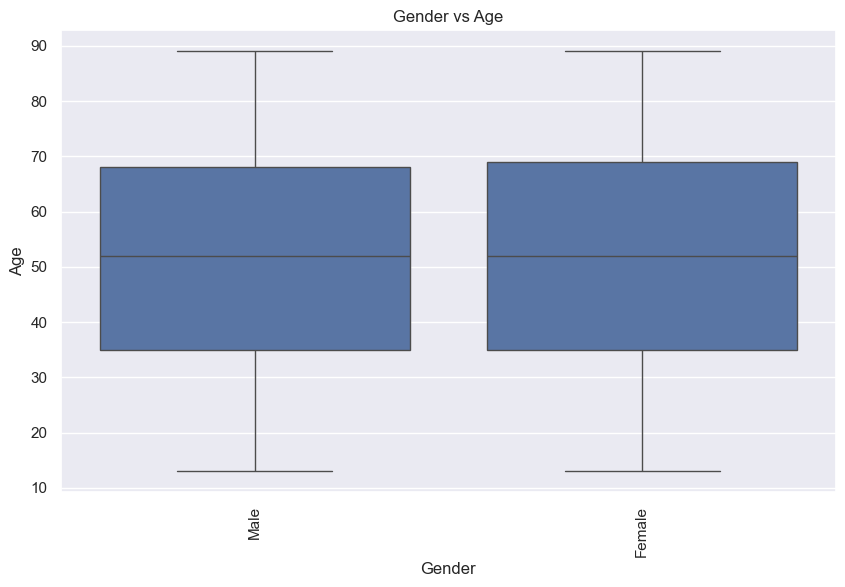

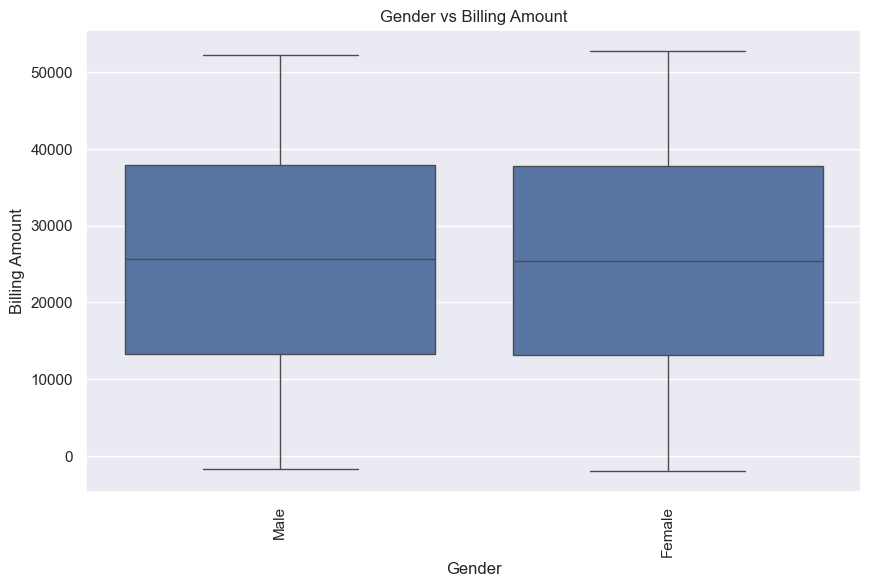

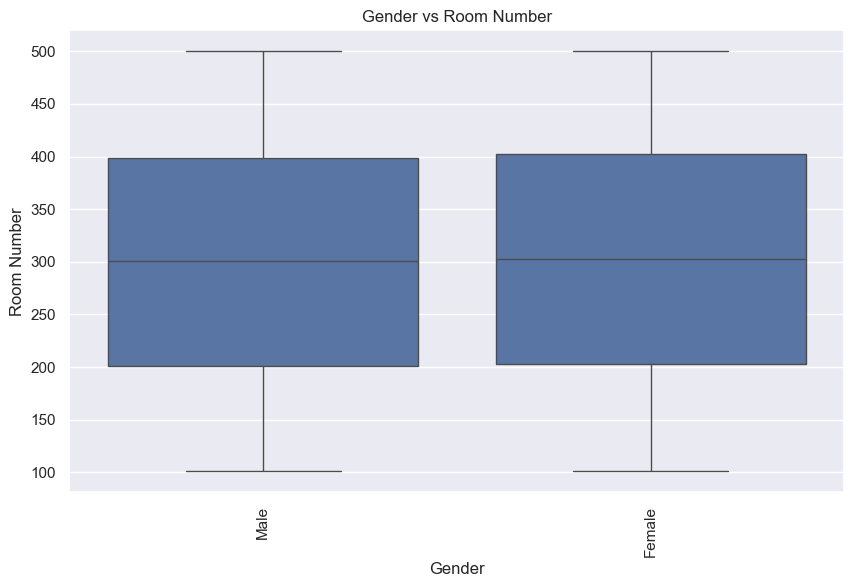

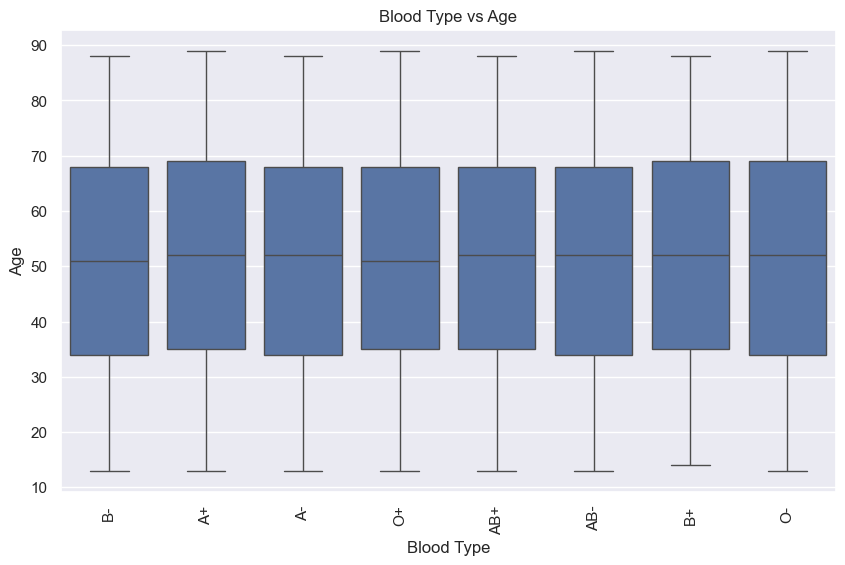

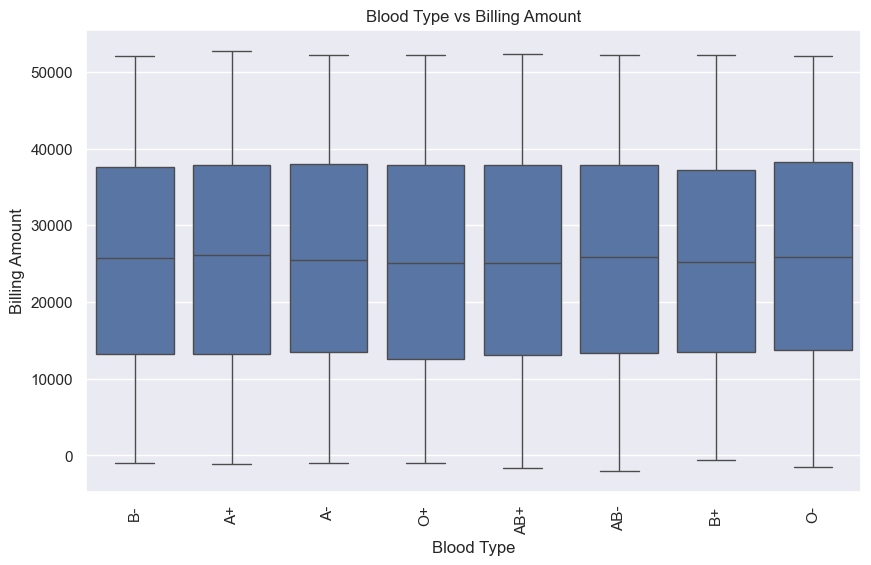

...

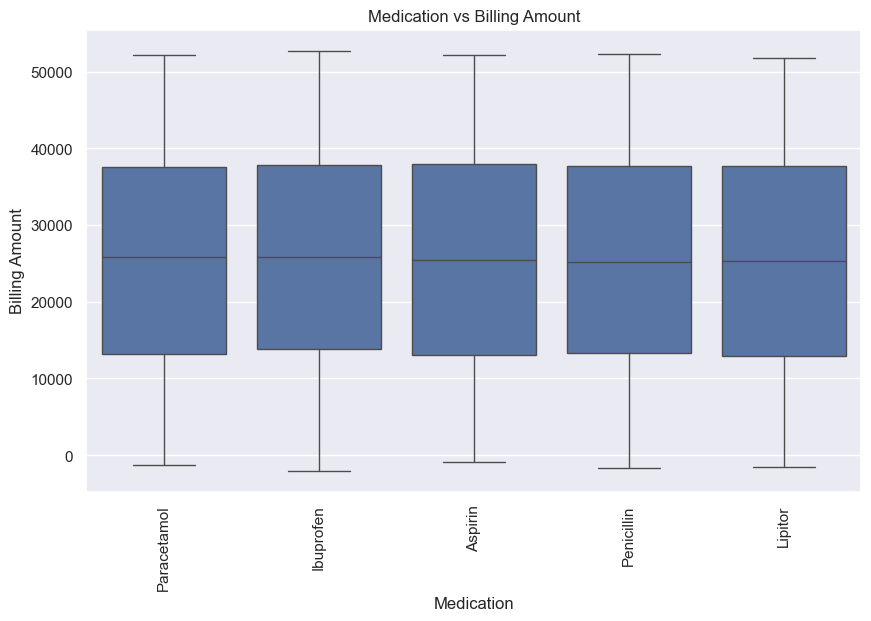

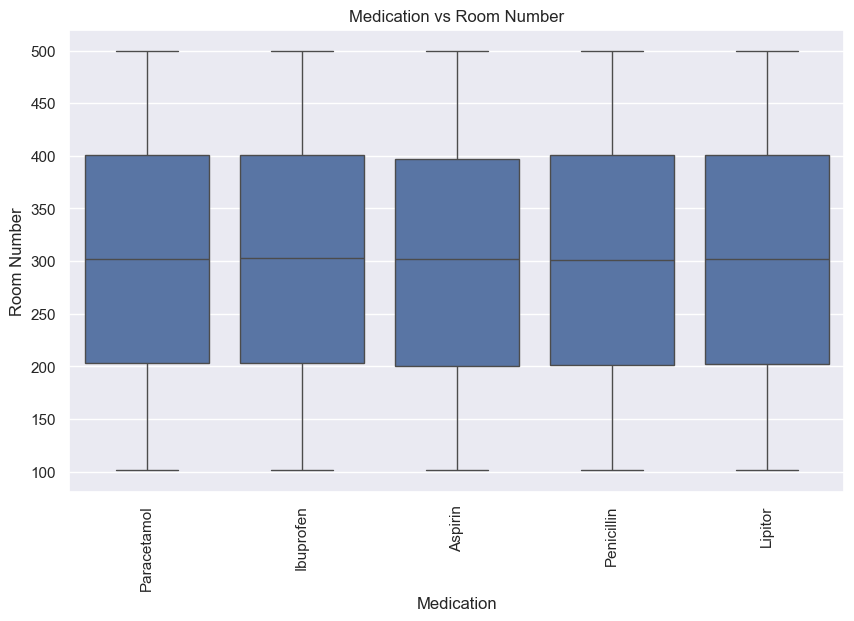

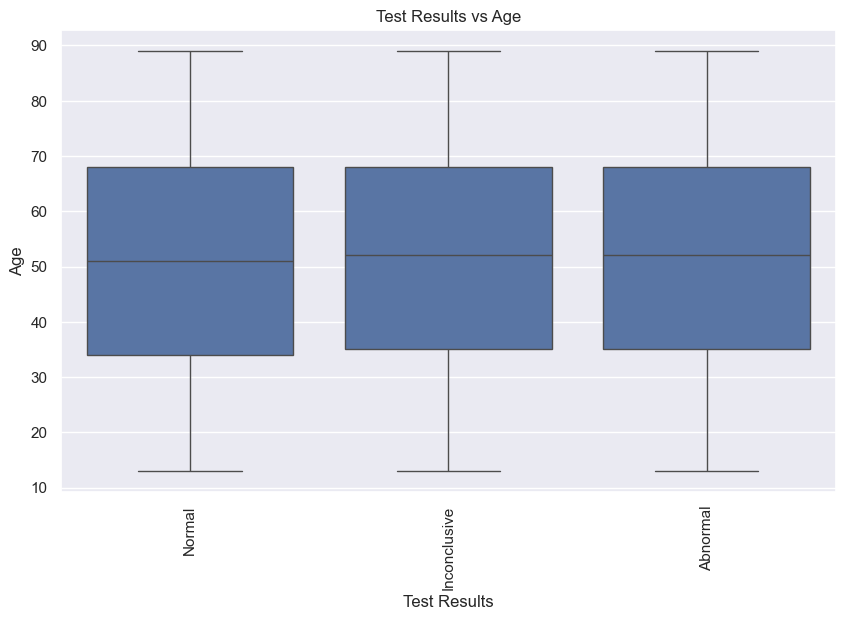

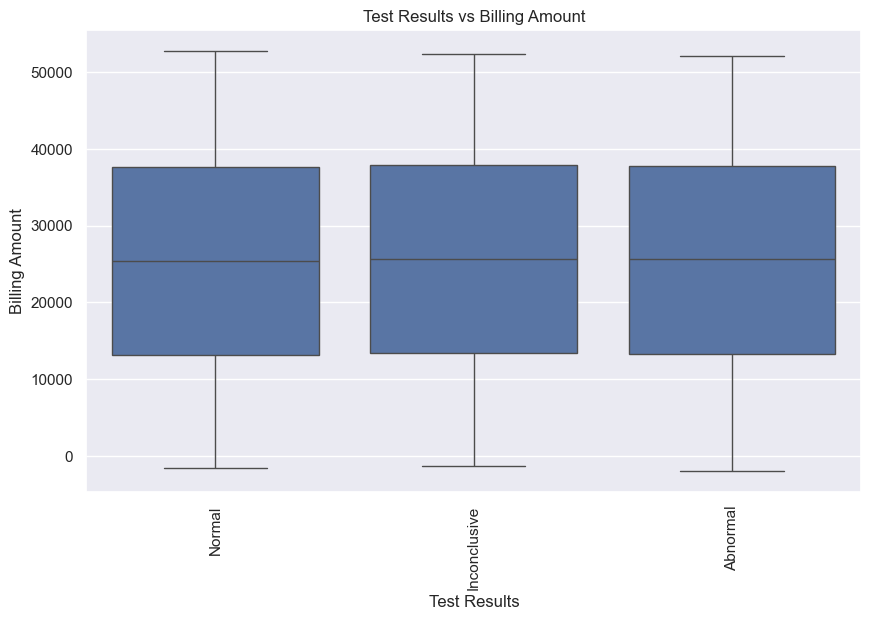

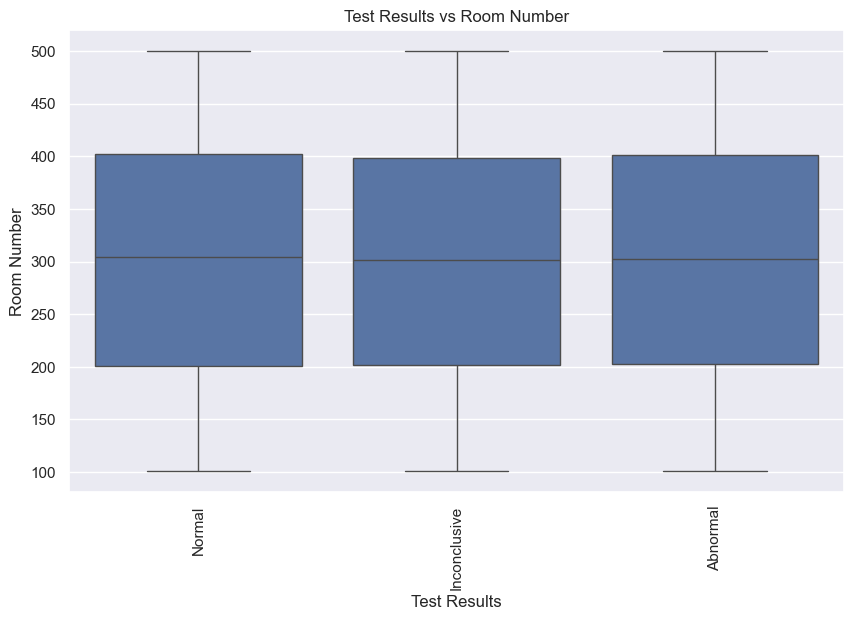

In [115]:
for dis in categorical:
    for cont in continuous:
        plt.figure(figsize=(10,6))
        ax = sns.boxplot(data=df, x=dis, y=cont)
        plt.title(f"{dis} vs {cont}")
        plt.xticks(rotation=90)
        plt.show()

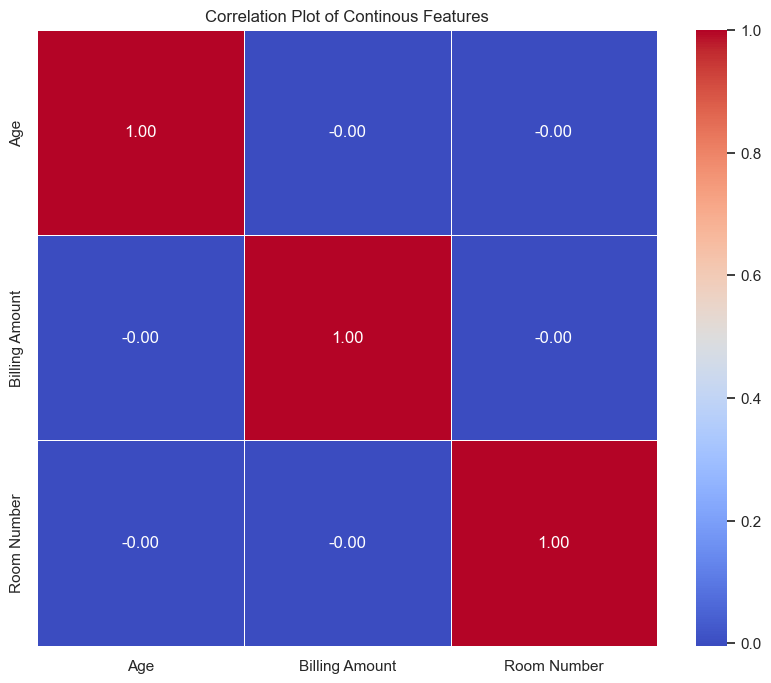

In [117]:
corr_matrix = df[continuous].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Plot of Continous Features")
plt.show()

In [119]:
corr_matrix

,Age,Billing Amount,Room Number
Age,1.000000,-0.003427,-0.000352
Billing Amount,-0.003427,1.000000,-0.003930
Room Number,-0.000352,-0.003930,1.000000


In [129]:
from scipy.stats import f_oneway
f_stat, p_val = f_oneway(df[df['Gender']=='Male']['Billing Amount'],
                         df[df['Gender']=='Female']['Billing Amount'])
print(f"ANOVA Result: F-statistic = {f_stat}, p-value = {p_val}")
                         

ANOVA Result: F-statistic = 1.3408137448241748, p-value = 0.24689554515167283


In [133]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [127]:
df['Medical Condition'].unique()


array(['Cancer', 'Obesity', 'Diabetes', 'Asthma', 'Hypertension',
       'Arthritis'], dtype=object)

In [137]:
df['Admission Type'].unique()

array(['Urgent', 'Emergency', 'Elective'], dtype=object)

In [139]:
from scipy.stats import chi2_contingency
contingency_table = pd.crosstab(df['Admission Type'], df['Medical Condition'])
contingency_table

Medical Condition,Arthritis,Asthma,Cancer,Diabetes,Hypertension,Obesity
Admission Type,,,,,,
Elective,3062,3069,3114,3031,3182,3015
Emergency,3073,2978,2988,2988,2975,3100
Urgent,3083,3048,3038,3197,2994,3031


In [143]:
chi2, p, dof, ex = chi2_contingency(contingency_table)
print(f"chi-Squre Test result : chi2={chi2},p-value={p}")

chi-Squre Test result : chi2=17.8903466905814,p-value=0.05684174826535973


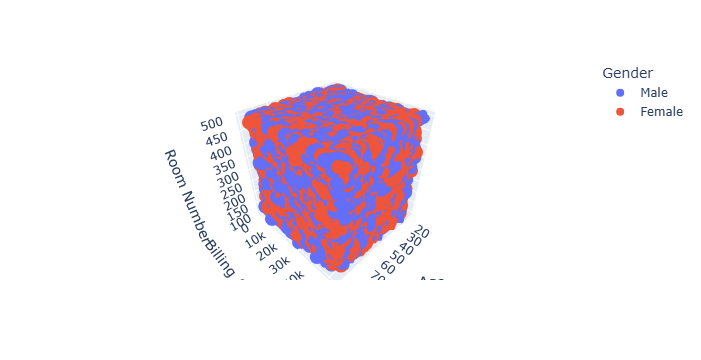

In [147]:
fig = px.scatter_3d(df, x='Age', y= 'Billing Amount', z = 'Room Number', color='Gender')
fig.show()

In [149]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [155]:
pivot_table = pd.pivot_table(df, values=['Age', 'Billing Amount'],
                             index = ['Gender', 'Medical Condition', 'Admission Type'],
                                      aggfunc={'Billing Amount':'mean','Age':'mean'})
pivot_table                               

Age  Billing Amount
Gender Medical Condition Admission Type                           
Female Arthritis         Elective        50.254990    25414.144607
                         Emergency       51.998072    25036.389922
                         Urgent          51.994129    25564.679900
       Asthma            Elective        51.147573    25490.918214
                         Emergency       51.568047    25468.207193
                         Urgent          52.420761    25101.857316
       Cancer            Elective        52.092208    25312.309738
                         Emergency       50.736944    25097.513220
                         Urgent          51.152542    25451.511538
       Diabetes          Elective        51.024918    25709.493051
                         Emergency       51.980731    25565.425113
                         Urgent          51.797973    25404.787550
       Hypertension      Elective        52.416406    25529.889579
                         Emergency       51.614353    25118.920307
                         Urgent          52.363268    25650.239969
       Obesity           Elective        52.106509    25465.834357
                         Emergency       51.024643    26392.463194
                         Urgent          50.866225    25746.819797
Male   Arthritis         Elective        51.591120    25546.952631
                         Emergency       51.445616    25969.665058
                         Urgent          51.963871    25552.155465
       Asthma            Elective        51.488845    25013.631482
                         Emergency       52.054907    26337.884796
                         Urgent          50.992514    26355.873985
       Cancer            Elective        51.183609    26023.609166
                         Emergency       52.953375    24618.664505
                         Urgent          51.230326    24379.955530
       Diabetes          Elective        51.297477    26358.827134
                         Emergency       51.469993    25376.403502
                         Urgent          51.891842    25562.589495
       Hypertension      Elective        50.913565    25580.478874
                         Emergency       50.720350    25825.482969
                         Urgent          52.272307    25311.874010
       Obesity           Elective        51.711513    25913.641197
                         Emergency       51.019897    25254.517370
                         Urgent          50.684418    26059.675047

In [165]:
pivot_table_multi = pd.pivot_table(df, values=['Billing Amount'],
                             index = ['Medical Condition', 'Gender'],
                                      aggfunc=['sum','mean', 'count','min','max'],margins=True)
pivot_table_multi                             

sum           mean          count  \
                         Billing Amount Billing Amount Billing Amount   
Medical Condition Gender                                                
Arthritis         Female   1.176154e+08   25337.234722           4642   
                  Male     1.175522e+08   25688.849297           4576   
Asthma            Female   1.143928e+08   25358.633474           4511   
                  Male     1.187435e+08   25903.913291           4584   
Cancer            Female   1.154482e+08   25284.314393           4566   
                  Male     1.144441e+08   25020.562355           4574   
Diabetes          Female   1.177971e+08   25558.060586           4609   
                  Male     1.186899e+08   25762.941146           4607   
Hypertension      Female   1.162115e+08   25434.788625           4569   
                  Male     1.171669e+08   25571.135120           4582   
Obesity           Female   1.183084e+08   25871.071549           4573   
                  Male     1.176983e+08   25737.652254           4573   
All                        1.404068e+09   25544.306284          54966   

                                    min            max  
                         Billing Amount Billing Amount  
Medical Condition Gender                                
Arthritis         Female    -964.798619   52170.036854  
                  Male     -1129.997176   51975.968135  
Asthma            Female   -1306.662189   52181.837792  
                  Male     -1520.420555   51336.221210  
Cancer            Female   -2008.492140   52373.032374  
                  Male     -1277.645337   52092.669896  
Diabetes          Female    -860.617987   52211.852966  
                  Male     -1316.618581   51848.201597  
Hypertension      Female    -652.181369   52764.276736  
                  Male     -1660.009373   52271.663747  
Obesity           Female    -967.594706   51501.649773  
                  Male     -1310.272895   52024.726443  
All                        -2008.492140   52764.276736

In [167]:
Grouped_data = df.groupby(['Gender','Medical Condition'])[['Billing Amount','Age']].mean()
Grouped_data

Billing Amount        Age
Gender Medical Condition                           
Female Arthritis            25337.234722  51.413615
       Asthma               25358.633474  51.697185
       Cancer               25284.314393  51.328296
       Diabetes             25558.060586  51.601866
       Hypertension         25434.788625  52.137448
       Obesity              25871.071549  51.332167
Male   Arthritis            25688.849297  51.669143
       Asthma               25903.913291  51.495201
       Cancer               25020.562355  51.755575
       Diabetes             25762.941146  51.561754
       Hypertension         25571.135120  51.299651
       Obesity              25737.652254  51.134266

In [169]:
Grouped_data = df.groupby('Admission Type')['Billing Amount'].agg([('median','median'),
                                                                  ('Standard Deviation','std')])
Grouped_data

,median,Standard Deviation
Admission Type,,
Elective,25674.735365,14220.835323
Emergency,25413.781043,14159.764673
Urgent,25543.558472,14244.202912


In [175]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Name                54966 non-null  object        
 1   Age                 54966 non-null  int64         
 2   Gender              54966 non-null  object        
 3   Blood Type          54966 non-null  object        
 4   Medical Condition   54966 non-null  object        
 5   Date of Admission   54966 non-null  datetime64[ns]
 6   Doctor              54966 non-null  object        
 7   Hospital            54966 non-null  object        
 8   Insurance Provider  54966 non-null  object        
 9   Billing Amount      54966 non-null  float64       
 10  Room Number         54966 non-null  int64         
 11  Admission Type      54966 non-null  object        
 12  Discharge Date      54966 non-null  object        
 13  Medication          54966 non-null  object        


In [173]:
df['Date of Admission'] = pd.to_datetime(df['Date of Admission'])

In [177]:
df['Admission Day'] = df['Date of Admission'].dt.day
df['Admission Month'] = df['Date of Admission'].dt.month
df['Admission Year'] = df['Date of Admission'].dt.year

In [179]:
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal,31,1,2024
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,20,8,2019
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal,22,9,2022
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal,18,11,2020
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal,19,9,2022


In [193]:
df['Discharge Date'] = pd.to_datetime(df['Discharge Date'], errors='coerce')


In [195]:
df['Discharge Date'] = pd.to_datetime(df['Discharge Date'], format='%d-%m-%Y')


In [199]:
df['Discharge Day'] = df['Discharge Date'].dt.day
df['Discharge Month'] = df['Discharge Date'].dt.month
df['Discharge Year'] = df['Discharge Date'].dt.year

In [181]:
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal,31,1,2024
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,20,8,2019
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal,22,9,2022
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal,18,11,2020
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal,19,9,2022


In [201]:
df['Days'] = df['Discharge Date'] - df['Date of Admission']
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,...,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year,Discharge Day,Discharge Month,Discharge Year,Days
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,...,2024-02-02,Paracetamol,Normal,31,1,2024,2,2,2024,2 days
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,...,2019-08-26,Ibuprofen,Inconclusive,20,8,2019,26,8,2019,6 days
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,...,2022-10-07,Aspirin,Normal,22,9,2022,7,10,2022,15 days
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,...,2020-12-18,Ibuprofen,Abnormal,18,11,2020,18,12,2020,30 days
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,...,2022-10-09,Penicillin,Abnormal,19,9,2022,9,10,2022,20 days


In [203]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results', 'Admission Day', 'Admission Month',
       'Admission Year', 'Discharge Day', 'Discharge Month', 'Discharge Year',
       'Days'],
      dtype='object')

In [207]:
df = df.drop(['Name','Date of Admission','Doctor','Hospital','Insurance Provider','Room Number',
              'Discharge Date'],axis=1)

In [209]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Billing Amount,Admission Type,Medication,Test Results,Admission Day,Admission Month,Admission Year,Discharge Day,Discharge Month,Discharge Year,Days
0,30,Male,B-,Cancer,18856.281306,Urgent,Paracetamol,Normal,31,1,2024,2,2,2024,2 days
1,62,Male,A+,Obesity,33643.327287,Emergency,Ibuprofen,Inconclusive,20,8,2019,26,8,2019,6 days
2,76,Female,A-,Obesity,27955.096079,Emergency,Aspirin,Normal,22,9,2022,7,10,2022,15 days
3,28,Female,O+,Diabetes,37909.782410,Elective,Ibuprofen,Abnormal,18,11,2020,18,12,2020,30 days
4,43,Female,AB+,Cancer,14238.317814,Urgent,Penicillin,Abnormal,19,9,2022,9,10,2022,20 days


In [211]:
df.columns

Index(['Age', 'Gender', 'Blood Type', 'Medical Condition', 'Billing Amount',
       'Admission Type', 'Medication', 'Test Results', 'Admission Day',
       'Admission Month', 'Admission Year', 'Discharge Day', 'Discharge Month',
       'Discharge Year', 'Days'],
      dtype='object')

In [227]:
print("Available columns in the DataFrame:")
print(df.columns)
print("\nColumns to drop:")
columns_to_drop = ['Billing Amount', 'Admission Day', 'Admission Month', 
                   'Admission Year', 'Discharge Day', 'Discharge Month', 
                   'Discharge Year']
print(columns_to_drop)

print("\nMissing columns:")
print(set(columns_to_drop) - set(df.columns))


Available columns in the DataFrame:
Index(['Age', 'Gender', 'Blood Type', 'Medical Condition', 'Admission Type',
       'Medication', 'Test Results', 'Days'],
      dtype='object')

Columns to drop:
['Billing Amount', 'Admission Day', 'Admission Month', 'Admission Year', 'Discharge Day', 'Discharge Month', 'Discharge Year']

Missing columns:
{'Discharge Month', 'Admission Month', 'Admission Day', 'Billing Amount', 'Admission Year', 'Discharge Day', 'Discharge Year'}


In [229]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2 days
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6 days
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15 days
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30 days
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20 days


In [231]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype          
---  ------             --------------  -----          
 0   Age                54966 non-null  int64          
 1   Gender             54966 non-null  object         
 2   Blood Type         54966 non-null  object         
 3   Medical Condition  54966 non-null  object         
 4   Admission Type     54966 non-null  object         
 5   Medication         54966 non-null  object         
 6   Test Results       54966 non-null  object         
 7   Days               54966 non-null  timedelta64[ns]
dtypes: int64(1), object(6), timedelta64[ns](1)
memory usage: 3.8+ MB


In [233]:
df['Days'] = df['Days'].astype(str)
df['Days_numeric'] = df['Days'].str.split().str[0].astype(int)

In [235]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days,Days_numeric
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2 days,2
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6 days,6
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15 days,15
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30 days,30
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20 days,20


In [237]:
df = df.drop('Days',axis=1)

In [239]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days_numeric
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20


In [241]:
categorical_features, non_categorical_features, discrete_features, continuous_features = classify_features(df)

print("Categorical_features :", categorical_features)
print("***************")
print("Non_categorical_features :", non_categorical_features)
print("***************")
print("Discrete_features :", discrete_features)
print("***************")
print("Continuous_features :", continuous_features)
print("***************")


Categorical_features : ['Gender', 'Blood Type', 'Medical Condition', 'Admission Type', 'Medication', 'Test Results']
***************
Non_categorical_features : []
***************
Discrete_features : []
***************
Continuous_features : ['Age']
***************


In [256]:
Categorical_features = ['Gender', 'Blood Type', 'Medical Condition', 'Admission Type', 'Medication']

In [258]:
Categorical_features

['Gender', 'Blood Type', 'Medical Condition', 'Admission Type', 'Medication']

In [264]:
df_dummies = pd.get_dummies(df[categorical_features],drop_first=True)

In [266]:
df_dummies

,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,Blood Type_O-,Medical Condition_Asthma,Medical Condition_Cancer,...,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin,Test Results_Inconclusive,Test Results_Normal
0,True,False,False,False,False,True,False,False,False,True,...,False,False,False,True,False,False,True,False,False,True
1,True,False,False,False,False,False,False,False,False,False,...,False,True,True,False,True,False,False,False,True,False
2,False,True,False,False,False,False,False,False,False,False,...,False,True,True,False,False,False,False,False,False,True
3,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,True,False,False,False,False,False
4,False,False,True,False,False,False,False,False,False,True,...,False,False,False,True,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55495,False,False,False,False,False,False,True,False,True,False,...,False,False,False,False,False,False,False,True,False,False
55496,False,False,False,True,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,True
55497,False,False,False,False,True,False,False,False,False,False,...,True,False,False,True,True,False,False,False,False,False
55498,True,False,False,False,False,False,False,True,False,False,...,False,False,False,False,True,False,False,False,False,False


In [268]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days_numeric
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20


In [272]:
df = pd.concat([df.drop(columns = Categorical_features),df_dummies], axis=1)

In [274]:
df.head()

,Age,Test Results,Days_numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,...,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin,Test Results_Inconclusive,Test Results_Normal
0,30,Normal,2,True,False,False,False,False,True,False,...,False,False,False,True,False,False,True,False,False,True
1,62,Inconclusive,6,True,False,False,False,False,False,False,...,False,True,True,False,True,False,False,False,True,False
2,76,Normal,15,False,True,False,False,False,False,False,...,False,True,True,False,False,False,False,False,False,True
3,28,Abnormal,30,False,False,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False
4,43,Abnormal,20,False,False,True,False,False,False,False,...,False,False,False,True,False,False,False,True,False,False


In [278]:
df['Test Results'].value_counts()

Test Results
Abnormal        18437
Normal          18331
Inconclusive    18198
Name: count, dtype: int64

In [316]:
test_result_mapping = {'Normal':0, 'Inconclusive' :2,'Abnormal':1}

In [322]:
print(df.columns)


Index(['Age', 'Days_numeric', 'Gender_Male', 'Blood Type_A-', 'Blood Type_AB+',
       'Blood Type_AB-', 'Blood Type_B+', 'Blood Type_B-', 'Blood Type_O+',
       'Blood Type_O-', 'Medical Condition_Asthma', 'Medical Condition_Cancer',
       'Medical Condition_Diabetes', 'Medical Condition_Hypertension',
       'Medical Condition_Obesity', 'Admission Type_Emergency',
       'Admission Type_Urgent', 'Medication_Ibuprofen', 'Medication_Lipitor',
       'Medication_Paracetamol', 'Medication_Penicillin'],
      dtype='object')


In [330]:
# Assuming 'Test Results' was transformed into 'Test Results_Inconclusive' and 'Test Results_Normal'
test_result_mapping = {'Inconclusive': 0, 'Normal': 1}

# Apply the mapping to the relevant columns
for col in df.filter(like='Test Results').columns:
    df[col] = df[col].replace(test_result_mapping)


In [332]:
df.head()

,Age,Days_numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,Blood Type_O-,...,Medical Condition_Cancer,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin
0,30,2,True,False,False,False,False,True,False,False,...,True,False,False,False,False,True,False,False,True,False
1,62,6,True,False,False,False,False,False,False,False,...,False,False,False,True,True,False,True,False,False,False
2,76,15,False,True,False,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False
3,28,30,False,False,False,False,False,False,True,False,...,False,True,False,False,False,False,True,False,False,False
4,43,20,False,False,True,False,False,False,False,False,...,True,False,False,False,False,True,False,False,False,True


In [338]:
# List of columns to drop
columns_to_drop = ['Test Results_Inconclusive', 'Test Results_Normal', 'Test_Result_Numeric']

# Drop only the columns that exist in the DataFrame
df = df.drop(columns=[col for col in columns_to_drop if col in df.columns], axis=1)

# Verify the result
print(df.columns)


Index(['Age', 'Days_numeric', 'Gender_Male', 'Blood Type_A-', 'Blood Type_AB+',
       'Blood Type_AB-', 'Blood Type_B+', 'Blood Type_B-', 'Blood Type_O+',
       'Blood Type_O-', 'Medical Condition_Asthma', 'Medical Condition_Cancer',
       'Medical Condition_Diabetes', 'Medical Condition_Hypertension',
       'Medical Condition_Obesity', 'Admission Type_Emergency',
       'Admission Type_Urgent', 'Medication_Ibuprofen', 'Medication_Lipitor',
       'Medication_Paracetamol', 'Medication_Penicillin'],
      dtype='object')


In [340]:
df.head()

,Age,Days_numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,Blood Type_O-,...,Medical Condition_Cancer,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin
0,30,2,True,False,False,False,False,True,False,False,...,True,False,False,False,False,True,False,False,True,False
1,62,6,True,False,False,False,False,False,False,False,...,False,False,False,True,True,False,True,False,False,False
2,76,15,False,True,False,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False
3,28,30,False,False,False,False,False,False,True,False,...,False,True,False,False,False,False,True,False,False,False
4,43,20,False,False,True,False,False,False,False,False,...,True,False,False,False,False,True,False,False,False,True


In [342]:
df['Age'].describe()

count    54966.000000
mean        51.535185
std         19.605661
min         13.000000
25%         35.000000
50%         52.000000
75%         68.000000
max         89.000000
Name: Age, dtype: float64

In [344]:
df['Days_numeric'].describe()

count    54966.000000
mean        15.499290
std          8.661471
min          1.000000
25%          8.000000
50%         15.000000
75%         23.000000
max         30.000000
Name: Days_numeric, dtype: float64

In [348]:
df.columns

Index(['Age', 'Days_numeric', 'Gender_Male', 'Blood Type_A-', 'Blood Type_AB+',
       'Blood Type_AB-', 'Blood Type_B+', 'Blood Type_B-', 'Blood Type_O+',
       'Blood Type_O-', 'Medical Condition_Asthma', 'Medical Condition_Cancer',
       'Medical Condition_Diabetes', 'Medical Condition_Hypertension',
       'Medical Condition_Obesity', 'Admission Type_Emergency',
       'Admission Type_Urgent', 'Medication_Ibuprofen', 'Medication_Lipitor',
       'Medication_Paracetamol', 'Medication_Penicillin'],
      dtype='object')

In [364]:
# Define independent variables (X) and dependent variable (y)
# Assuming you want to create a target variable from the available columns

# For example, creating a binary target 'Test_Result' based on some condition (e.g., Age > 50 for this example)
df['Test_Result'] = (df['Age'] > 50).astype(int)  # Just an example, replace with actual condition

# Now split the data into independent (X) and dependent variable (y)
x = df.drop('Test_Result', axis=1)  # Independent variables (excluding 'Test_Result' column)
y = df['Test_Result']  # Dependent variable (target)

# Show the first few rows of independent variables (x)
print(x.head())


   Age  Days_numeric  Gender_Male  Blood Type_A-  Blood Type_AB+  \
0   30             2         True          False           False   
1   62             6         True          False           False   
2   76            15        False           True           False   
3   28            30        False          False           False   
4   43            20        False          False            True   

   Blood Type_AB-  Blood Type_B+  Blood Type_B-  Blood Type_O+  Blood Type_O-  \
0           False          False           True          False          False   
1           False          False          False          False          False   
2           False          False          False          False          False   
3           False          False          False           True          False   
4           False          False          False          False          False   

   ...  Medical Condition_Cancer  Medical Condition_Diabetes  \
0  ...                      True        

In [366]:
# Show the dependent variable (y)
print(y.head())


0    0
1    1
2    1
3    0
4    0
Name: Test_Result, dtype: int32


In [372]:
from sklearn.model_selection import train_test_split  # Corrected import

# Splitting the data into training and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)




Logistic Regrssion Model

In [380]:
from sklearn.linear_model import LogisticRegression  # Corrected import
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Initialize the Logistic Regression model
model = LogisticRegression()

# Fit the model on the training data
model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = model.predict(x_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 0.99
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      5315
           1       0.99      0.99      0.99      5679

    accuracy                           0.99     10994
   macro avg       0.99      0.99      0.99     10994
weighted avg       0.99      0.99      0.99     10994



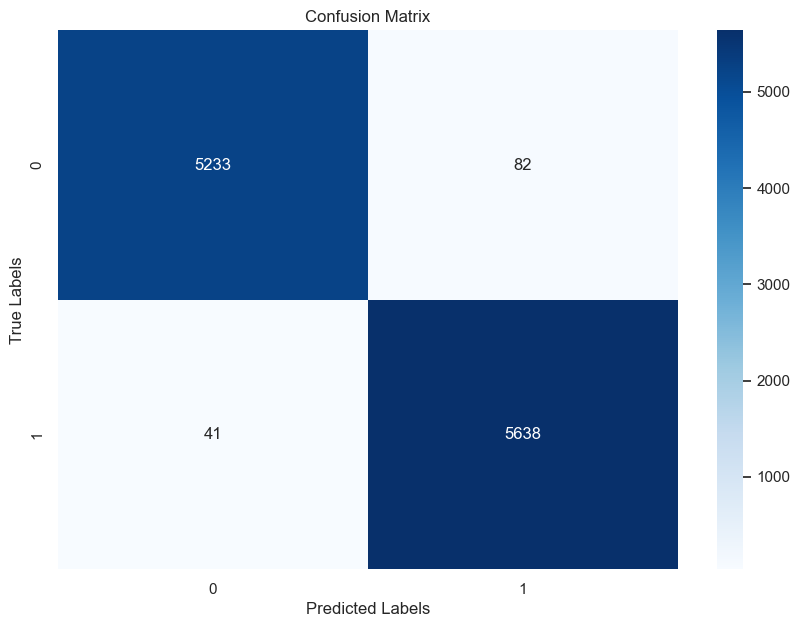

In [382]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix

# Plot confusion matrix
plt.figure(figsize=(10,7))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test)) 
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()


DecisionTreeClassifier

Accuracy: 1.00

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5315
           1       1.00      1.00      1.00      5679

    accuracy                           1.00     10994
   macro avg       1.00      1.00      1.00     10994
weighted avg       1.00      1.00      1.00     10994



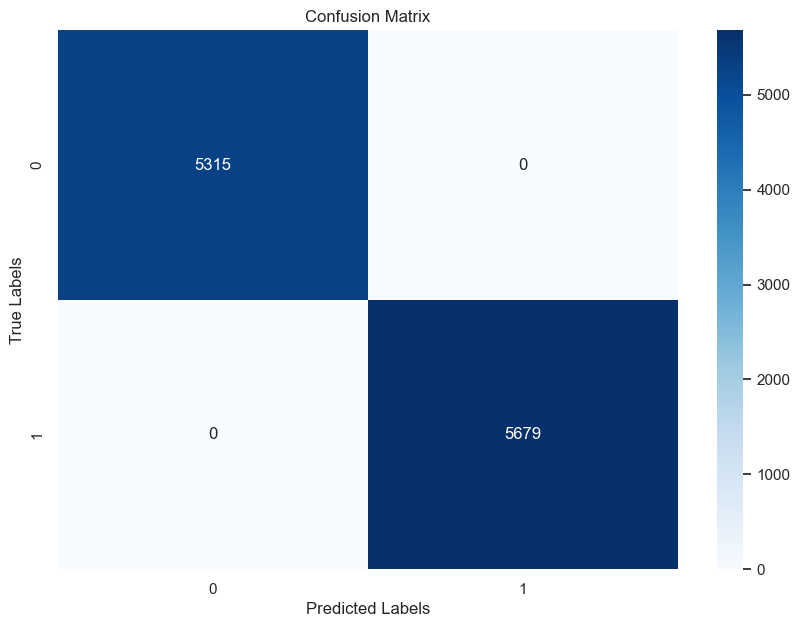

In [390]:
# Import necessary libraries
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create a decision tree classifier
dt_model = DecisionTreeClassifier(random_state=42)

# Fit the model on the training data
dt_model.fit(x_train, y_train)

# Make predictions on the test data
y_pred = dt_model.predict(x_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# Classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

